In [1]:
# database and numeric libraries
import pandas as pd
import numpy as np

#visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import matplotlib.dates as mdates
import statsmodels.api as sm


#Display all the columns and rows
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
from tabulate import tabulate

# command to ignore warnings during filtering
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('support2-1.csv')
df.head()

,ID,age,death,sex,hospdead,slos,d.time,dzgroup,dzclass,num.co,edu,income,scoma,charges,totcst,totmcst,avtisst,race,sps,aps,surv2m,surv6m,hday,diabetes,dementia,ca,prg2m,prg6m,dnr,dnrday,meanbp,wblc,hrt,resp,temp,pafi,alb,bili,crea,sod,ph,glucose,bun,urine,adlp,adls,sfdm2,adlsc
0,1,62.84998,0,male,0,5,2029,Lung Cancer,Cancer,0,11.0,$11-$25k,0.0,9715.0,NaN,NaN,7.000000,other,33.898438,20.0,0.262939,0.036995,1,0,0,metastatic,0.50,0.25,no dnr,5.0,97.0,6.000000,69.0,22.0,36.00000,388.00000,1.799805,0.199982,1.199951,141.0,7.459961,NaN,NaN,NaN,7.0,7.0,NaN,7.0
1,2,60.33899,1,female,1,4,4,Cirrhosis,COPD/CHF/Cirrhosis,2,12.0,$11-$25k,44.0,34496.0,NaN,NaN,29.000000,white,52.695312,74.0,0.001000,0.000000,3,0,0,no,0.00,0.00,NaN,NaN,43.0,17.097656,112.0,34.0,34.59375,98.00000,NaN,NaN,5.500000,132.0,7.250000,NaN,NaN,NaN,NaN,1.0,<2 mo. follow-up,1.0
2,3,52.74698,1,female,0,17,47,Cirrhosis,COPD/CHF/Cirrhosis,2,12.0,under $11k,0.0,41094.0,NaN,NaN,13.000000,white,20.500000,45.0,0.790894,0.664917,4,0,0,no,0.75,0.50,no dnr,17.0,70.0,8.500000,88.0,28.0,37.39844,231.65625,NaN,2.199707,2.000000,134.0,7.459961,NaN,NaN,NaN,1.0,0.0,<2 mo. follow-up,0.0
3,4,42.38498,1,female,0,3,133,Lung Cancer,Cancer,2,11.0,under $11k,0.0,3075.0,NaN,NaN,7.000000,white,20.097656,19.0,0.698975,0.411987,1,0,0,metastatic,0.90,0.50,no dnr,3.0,75.0,9.099609,88.0,32.0,35.00000,NaN,NaN,NaN,0.799927,139.0,NaN,NaN,NaN,NaN,0.0,0.0,no(M2 and SIP pres),0.0
4,5,79.88495,0,female,0,16,2029,ARF/MOSF w/Sepsis,ARF/MOSF,1,NaN,NaN,26.0,50127.0,NaN,NaN,18.666656,white,23.500000,30.0,0.634888,0.532959,3,0,0,no,0.90,0.90,no dnr,16.0,59.0,13.500000,112.0,20.0,37.89844,173.31250,NaN,NaN,0.799927,143.0,7.509766,NaN,NaN,NaN,NaN,2.0,no(M2 and SIP pres),2.0


In [3]:
def preliminary_data_analysis(df):
    # printing the first 5 and the last 5 rows of the dataset
    print(f"Printing the first 5 rows of the dataset:\n{tabulate(df.head(), headers = 'keys', tablefmt = 'psql')}\n\n")
    print(f"Printing the last 5 rows of the dataset:\n{tabulate(df.tail(), headers = 'keys', tablefmt = 'psql')}\n\n")
    print('*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*\n\n')

    # printing the number of rows and columns in the dataset
    print(f"There are {df.shape[0]} rows and {df.shape[1]} columns in this dataset.")
    print('*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*\n\n')

    # printing a concise summary of the dataset
    print(f"The following is a concise summary of the dataset -->\n")
    print(df.info())
    print('*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*\n\n')

    # printing all the numerical datatype columns
    numerical_columns = df.select_dtypes(include=['number']).columns.tolist()
    print(f"Printing all the numerical columns --> {numerical_columns}")
    # printing all the object datatype columns
    object_columns = df.select_dtypes(include=['object']).columns.tolist()
    print(f"Printing all the Object columns --> {object_columns}")
    print('*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*\n\n')

    # finding the missing values
    print(f"Finding the number of missing values in all the columns -->\n")
    print(df.isna().sum())
    print('*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*-----*\n\n')

In [4]:
preliminary_data_analysis(df)

Printing the first 5 rows of the dataset:
+----+------+--------+---------+--------+------------+--------+----------+-------------------+--------------------+----------+-------+------------+---------+-----------+----------+-----------+-----------+--------+---------+-------+-------------+-----------+--------+------------+------------+------------+---------+---------+--------+----------+----------+----------+-------+--------+---------+---------+----------+------------+----------+-------+-----------+-----------+-------+---------+--------+--------+---------------------+---------+
|    |   ID |    age |   death | sex    |   hospdead |   slos |   d.time | dzgroup           | dzclass            |   num.co |   edu | income     |   scoma |   charges |   totcst |   totmcst |   avtisst | race   |     sps |   aps |      surv2m |    surv6m |   hday |   diabetes |   dementia | ca         |   prg2m |   prg6m | dnr    |   dnrday |   meanbp |     wblc |   hrt |   resp |    temp |    pafi |      alb |   

In [5]:
missing_values = df[df.isna().any(axis=1)]
print(missing_values)

total_missing_percentage = (df.isna().sum().sum() / (df.shape[0] * df.shape[1])) * 100
print(f"The total percentage of missing values in the dataset is: {total_missing_percentage}%")



        ID        age  death     sex  hospdead  slos  d.time  \
0        1   62.84998      0    male         0     5    2029   
1        2   60.33899      1  female         1     4       4   
2        3   52.74698      1  female         0    17      47   
3        4   42.38498      1  female         0     3     133   
4        5   79.88495      0  female         0    16    2029   
5        6   93.01599      1    male         1     4       4   
6        7   62.37097      1    male         0     9     659   
7        8   86.83899      1    male         0     7     142   
8        9   85.65594      1    male         0    12      63   
9       10   42.25897      1  female         0     8     370   
10      11   47.94498      1    male         0     7     114   
11      12   59.20099      1    male         1    13      13   
12      13   29.00200      1  female         0     4     160   
13      14   68.14197      1    male         0     8    1866   
14      15   43.53998      0  female    

In [6]:
'''# Function to impute missing values
def impute_missing_values(df):
    """
    This function imputes missing values in a dataframe.

    Parameters:
    df (DataFrame): The input dataframe.

    Returns:
    DataFrame: The dataframe with imputed missing values.
    """

    # Impute missing values in numerical columns with mean
    numerical_columns = df.select_dtypes(include=['number']).columns.tolist()
    df[numerical_columns] = df[numerical_columns].fillna(df[numerical_columns].mean())

    # Impute missing values in categorical columns with mode
    categorical_columns = df.select_dtypes(include=['object']).columns.tolist()
    df[categorical_columns] = df[categorical_columns].fillna(df[categorical_columns].mode().iloc[0])

    return df

# Impute missing values in the dataset
df_imputed = impute_missing_values(df)

# Display the imputed dataset
df_imputed.head()
'''

'# Function to impute missing values\ndef impute_missing_values(df):\n    """\n    This function imputes missing values in a dataframe.\n\n    Parameters:\n    df (DataFrame): The input dataframe.\n\n    Returns:\n    DataFrame: The dataframe with imputed missing values.\n    """\n\n    # Impute missing values in numerical columns with mean\n    numerical_columns = df.select_dtypes(include=[\'number\']).columns.tolist()\n    df[numerical_columns] = df[numerical_columns].fillna(df[numerical_columns].mean())\n\n    # Impute missing values in categorical columns with mode\n    categorical_columns = df.select_dtypes(include=[\'object\']).columns.tolist()\n    df[categorical_columns] = df[categorical_columns].fillna(df[categorical_columns].mode().iloc[0])\n\n    return df\n\n# Impute missing values in the dataset\ndf_imputed = impute_missing_values(df)\n\n# Display the imputed dataset\ndf_imputed.head()\n'

# EDA

## Data Cleaning

In [7]:
def dataUnderstanding(data):
  # Number of the rows and columns
  rows, columns = df.shape
  print('-' * 50)
  print(f"Number of Rows:{rows} | Number of Columns:{columns}")
  print('-' * 50)
  print()

  # List of columns
  columns_df = pd.DataFrame(df.columns, columns=["Column Names"])
  print("List of Features in the dataset:")
  print(tabulate(columns_df, headers='keys', tablefmt='psql', showindex=False))
  print('-' * 50)
  print()

  # Print Data type
  print("Summarized basic information:\n")
  df.info()
  print('-' * 50)
  print()

  # Statistical Summary
  def generate_statistical_summary(df, data_type):
      if data_type == 'numeric':
          summary = df.describe(exclude=['object','datetime64'])
      elif data_type == 'object':
          summary = df.describe(include=['object'])
      else:
          summary = "Invalid data type specified"
      return summary

  # For numeric data
  numeric_summary = generate_statistical_summary(df, 'numeric')
  print("Statistical Summary for Numeric Data:")
  print(tabulate(numeric_summary, headers='keys', tablefmt='pretty'))

  # For object data
  object_summary = generate_statistical_summary(df, 'object')
  print("\nStatistical Summary for Object Data:")
  print(tabulate(object_summary, headers='keys', tablefmt='pretty'))

dataUnderstanding(df)

--------------------------------------------------
Number of Rows:9105 | Number of Columns:48
--------------------------------------------------

List of Features in the dataset:
+----------------+
| Column Names   |
|----------------|
| ID             |
| age            |
| death          |
| sex            |
| hospdead       |
| slos           |
| d.time         |
| dzgroup        |
| dzclass        |
| num.co         |
| edu            |
| income         |
| scoma          |
| charges        |
| totcst         |
| totmcst        |
| avtisst        |
| race           |
| sps            |
| aps            |
| surv2m         |
| surv6m         |
| hday           |
| diabetes       |
| dementia       |
| ca             |
| prg2m          |
| prg6m          |
| dnr            |
| dnrday         |
| meanbp         |
| wblc           |
| hrt            |
| resp           |
| temp           |
| pafi           |
| alb            |
| bili           |
| crea           |
| sod            |
| ph

In [8]:
def calculate_missing_values(df):
  # Total percent of overall data
  total_percentage_missing = (
      (
          (df.isnull() | df.isna() | (df == '')).sum().sum()
          / (df.size)
      ) * 100
  ).round(2)
  print(f"The total percentage of missing values is: {total_percentage_missing}% \n")

  # Count of missing values
  missing_count = (
      (df.isnull() | df.isna()).sum() +
      (df == '').sum()
  )

  # Percentage of missing values
  missing_percentage = (
      ((df.isnull() | df.isna()).sum() +
      (df == '').sum()) * 100 / len(df)
  ).round(2)

  # Create a DataFrame to store the results
  statistical_df = pd.DataFrame({
      "Count of Missing Values": missing_count,
      "Percentage of Missing Values (%)": missing_percentage
  })

  # Print the combined table
  print("Combined Summary Table:")
  print(tabulate(statistical_df, headers='keys', tablefmt='pretty'))

calculate_missing_values(df)

The total percentage of missing values is: 10.78% 

Combined Summary Table:
+----------+-------------------------+----------------------------------+
|          | Count of Missing Values | Percentage of Missing Values (%) |
+----------+-------------------------+----------------------------------+
|    ID    |           0.0           |               0.0                |
|   age    |           0.0           |               0.0                |
|  death   |           0.0           |               0.0                |
|   sex    |           0.0           |               0.0                |
| hospdead |           0.0           |               0.0                |
|   slos   |           0.0           |               0.0                |
|  d.time  |           0.0           |               0.0                |
| dzgroup  |           0.0           |               0.0                |
| dzclass  |           0.0           |               0.0                |
|  num.co  |           0.0          

## Understanding the outliers

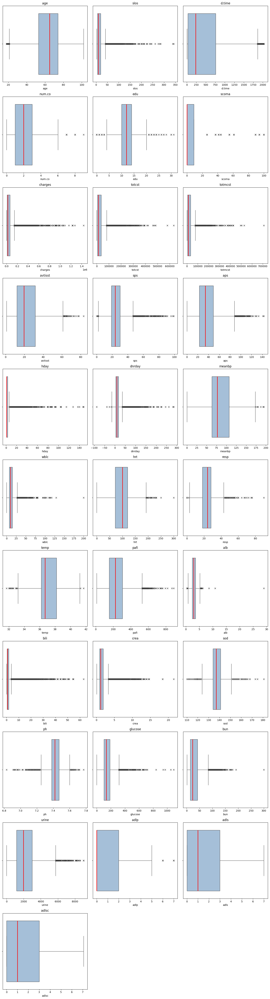

In [9]:
# Selecting only the numerical columns
df_numerical = df.select_dtypes(include=['float64', 'int64'])

# Drop ID column
df_numerical = df_numerical.drop('ID', axis=1)

# Filtering out columns where the maximum value is 1 or less
df_numerical = df_numerical.loc[:, df_numerical.max() > 1]

# Determining the number of rows and columns for subplots
n_cols = 3
n_rows = (len(df_numerical.columns) + n_cols - 1) // n_cols

# Creating the subplots
plt.figure(figsize=(n_cols * 5, n_rows * 5))
for i, column in enumerate(df_numerical.columns):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.boxplot(x=df_numerical[column], flierprops={"marker": "x"}, boxprops={"facecolor": (.3, .5, .7, .5)}, medianprops={"color": "r", "linewidth": 2})
    plt.title(column)

plt.tight_layout()
plt.show()

## Understanding data distribution


### Data distribution of numerical features

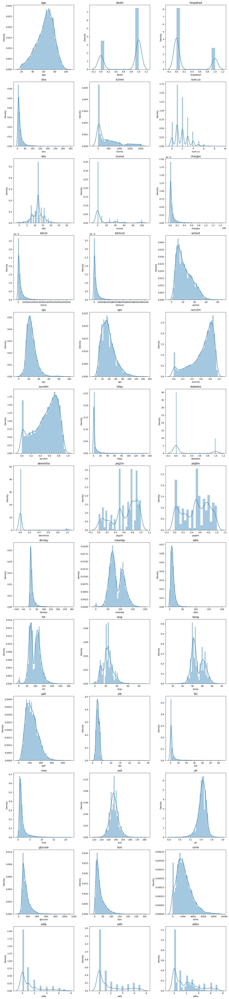

In [10]:
# Selecting only the numerical columns
df_numerical = df.select_dtypes(include=['float64', 'int64'])

# Drop ID column
df_numerical = df_numerical.drop('ID', axis=1)

# Determining the number of rows and columns for subplots
n_cols = 3
n_rows = (len(df_numerical.columns) + n_cols - 1) // n_cols

# Creating the subplots
plt.figure(figsize=(n_cols * 5, n_rows * 5))
for i, column in enumerate(df_numerical.columns):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.distplot(df[column])
    plt.title(column)

plt.tight_layout()
plt.show()

### Data distribution of object features

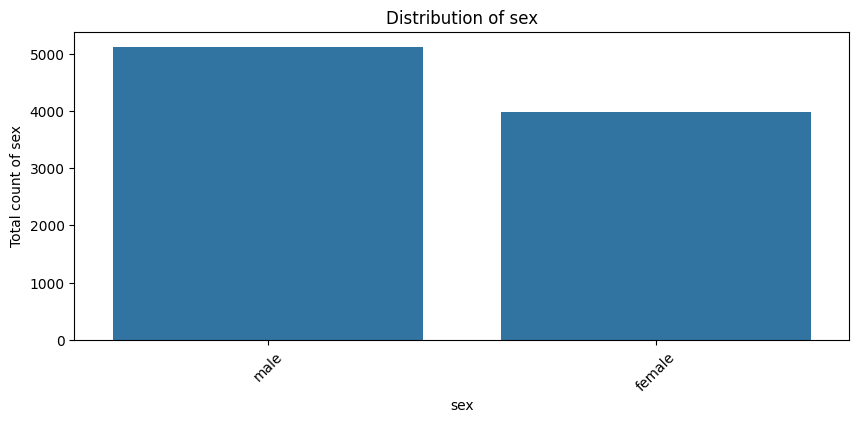

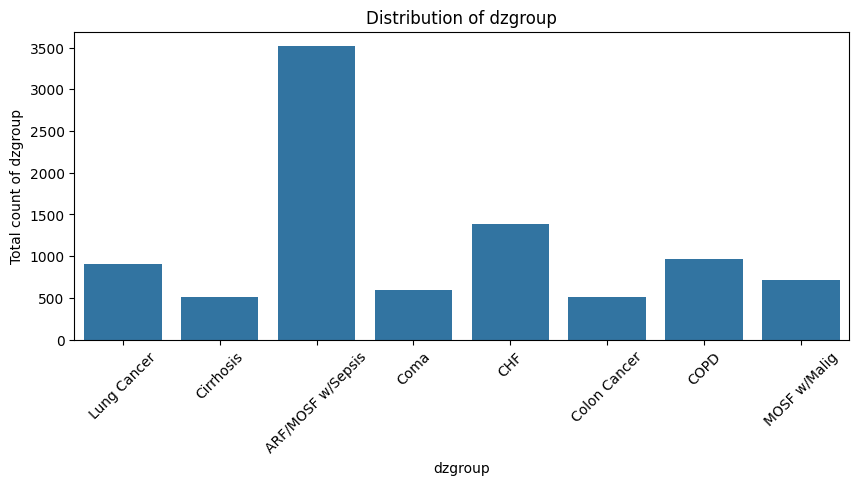

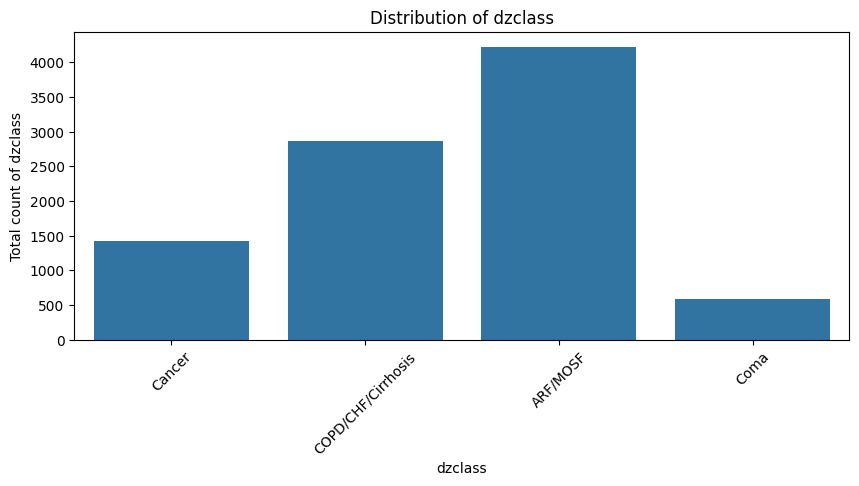

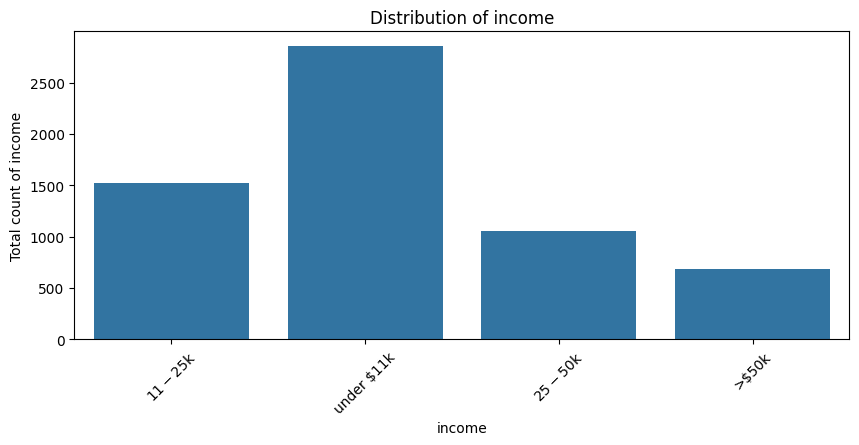

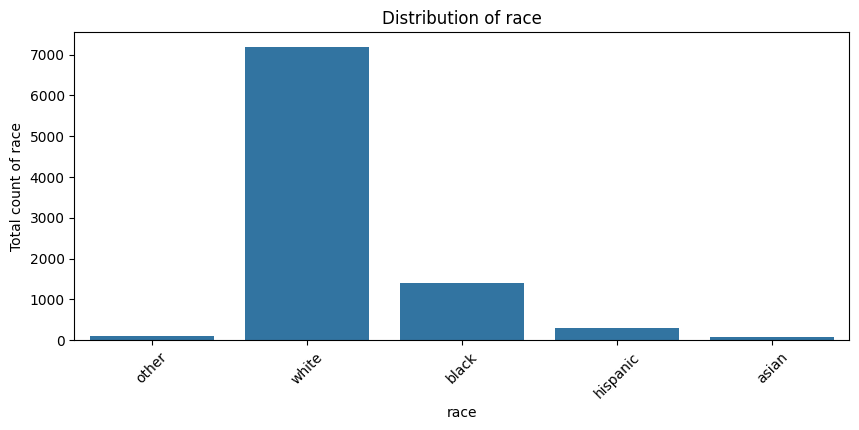

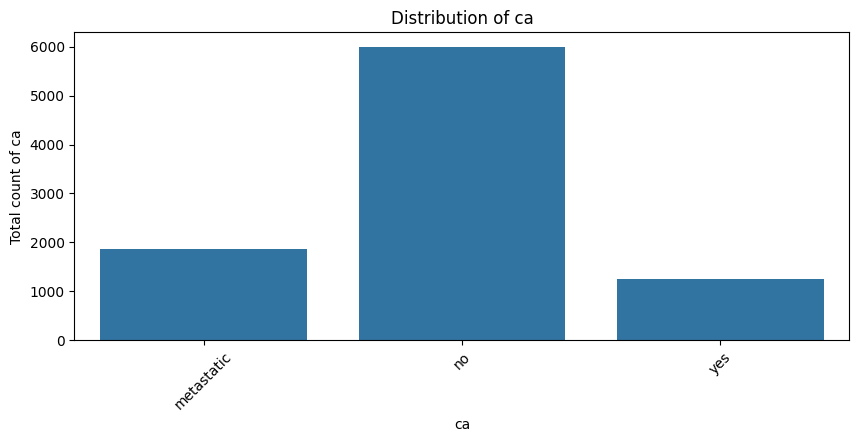

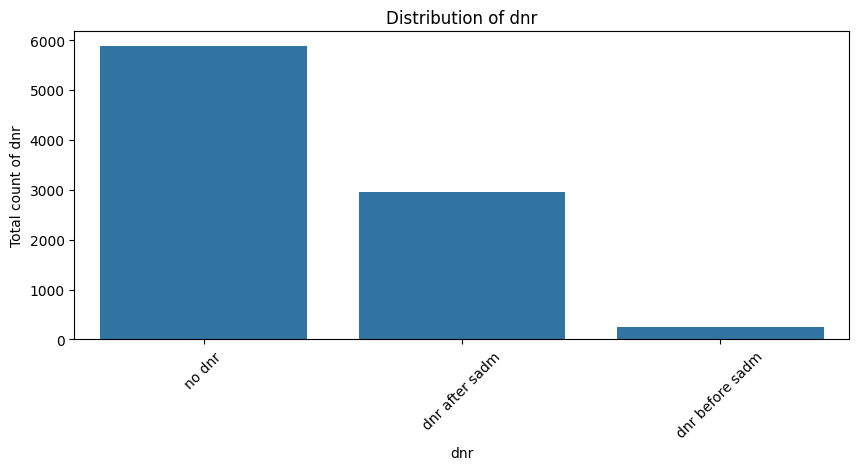

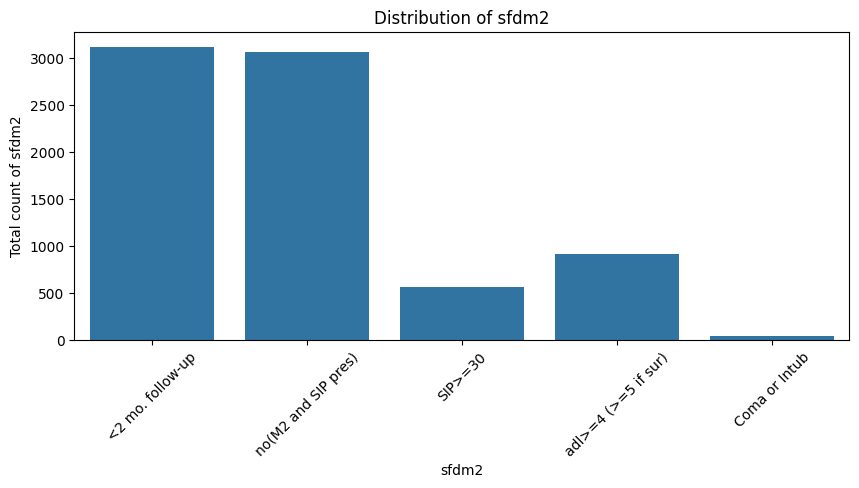

In [11]:
# Selecting only the object columns
df_object = df.select_dtypes(include=['object'])

# Plotting the distribution of each object-type column
for column in df_object.columns:
    plt.figure(figsize=(10, 4))
    sns.countplot(data=df_object, x=column)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)
    plt.ylabel(f"Total count of {column}")
    plt.show()

### Correlation analysis

In [12]:
# Mapping string categoric values to numeric categoric values to check correlation
# Creating copy of original dataframe
df_dummies = df.copy()

# Dropping ID column
df_dummies = df_dummies.drop('ID', axis=1)

str_categoryFeatures = ['sex', 'dzgroup', 'dzclass', 'income', 'race', 'ca', 'dnr', 'sfdm2']

# Loop through each categorical feature and replace it with its dummy encoded values
for feature in str_categoryFeatures:
    # Create a mapping from each unique category to a unique integer
    category_map = {category: index for index, category in enumerate(df_dummies[feature].unique())}

    # Replace the original column values with the mapped integer values
    df_dummies[feature] = df_dummies[feature].map(category_map)

# Display the first few rows of the modified DataFrame
df_dummies.head()

,age,death,sex,hospdead,slos,d.time,dzgroup,dzclass,num.co,edu,income,scoma,charges,totcst,totmcst,avtisst,race,sps,aps,surv2m,surv6m,hday,diabetes,dementia,ca,prg2m,prg6m,dnr,dnrday,meanbp,wblc,hrt,resp,temp,pafi,alb,bili,crea,sod,ph,glucose,bun,urine,adlp,adls,sfdm2,adlsc
0,62.84998,0,0,0,5,2029,0,0,0,11.0,0,0.0,9715.0,NaN,NaN,7.000000,0,33.898438,20.0,0.262939,0.036995,1,0,0,0,0.50,0.25,0,5.0,97.0,6.000000,69.0,22.0,36.00000,388.00000,1.799805,0.199982,1.199951,141.0,7.459961,NaN,NaN,NaN,7.0,7.0,0,7.0
1,60.33899,1,1,1,4,4,1,1,2,12.0,0,44.0,34496.0,NaN,NaN,29.000000,1,52.695312,74.0,0.001000,0.000000,3,0,0,1,0.00,0.00,1,NaN,43.0,17.097656,112.0,34.0,34.59375,98.00000,NaN,NaN,5.500000,132.0,7.250000,NaN,NaN,NaN,NaN,1.0,1,1.0
2,52.74698,1,1,0,17,47,1,1,2,12.0,1,0.0,41094.0,NaN,NaN,13.000000,1,20.500000,45.0,0.790894,0.664917,4,0,0,1,0.75,0.50,0,17.0,70.0,8.500000,88.0,28.0,37.39844,231.65625,NaN,2.199707,2.000000,134.0,7.459961,NaN,NaN,NaN,1.0,0.0,1,0.0
3,42.38498,1,1,0,3,133,0,0,2,11.0,1,0.0,3075.0,NaN,NaN,7.000000,1,20.097656,19.0,0.698975,0.411987,1,0,0,0,0.90,0.50,0,3.0,75.0,9.099609,88.0,32.0,35.00000,NaN,NaN,NaN,0.799927,139.0,NaN,NaN,NaN,NaN,0.0,0.0,2,0.0
4,79.88495,0,1,0,16,2029,2,2,1,NaN,2,26.0,50127.0,NaN,NaN,18.666656,1,23.500000,30.0,0.634888,0.532959,3,0,0,1,0.90,0.90,0,16.0,59.0,13.500000,112.0,20.0,37.89844,173.31250,NaN,NaN,0.799927,143.0,7.509766,NaN,NaN,NaN,NaN,2.0,2,2.0


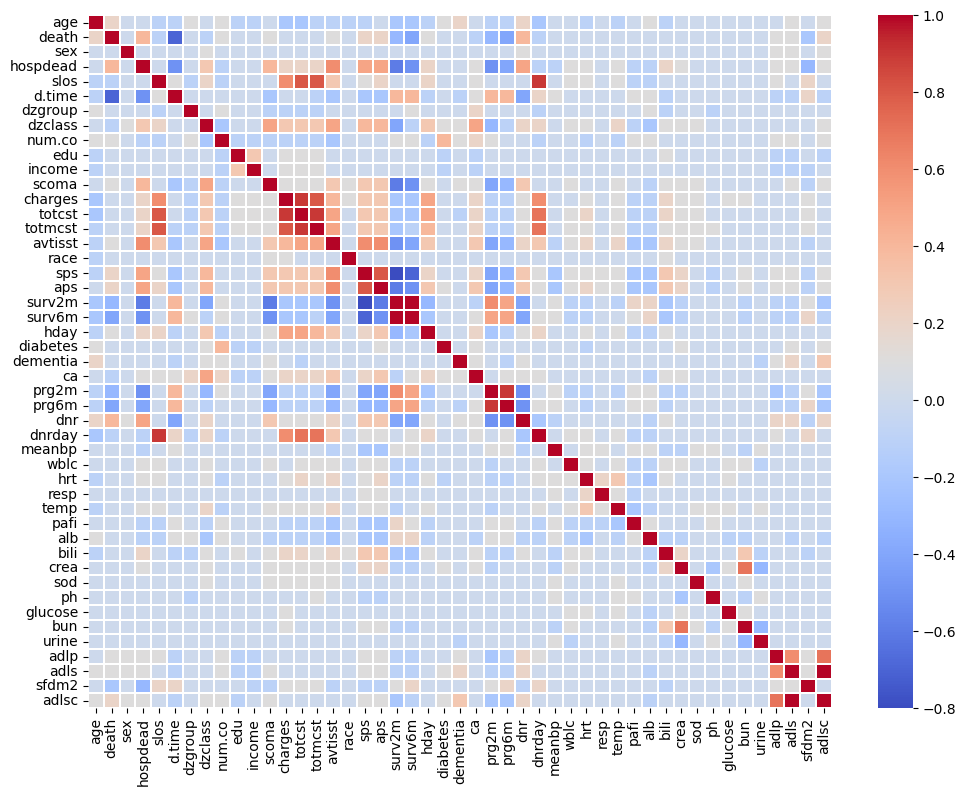

In [13]:
# Find correlation between features
corr_matrix = round(df_dummies.corr(),1)

# # Create mask of lower triangle
# upperTri = np.triu(corr_matrix)

# Print the plot
plt.figure(figsize=(12,9))
sns.heatmap(corr_matrix, annot=False, fmt=".1f", linewidth=.1, cmap='coolwarm')
plt.show()

In [14]:
# Finding pairs of features with a positive correlation greater than +0.4
pairs = corr_matrix.unstack()
strong_positive_pairs = pairs[(pairs > 0.4) & (pairs < 1.0)]

# Converting the pairs to a DataFrame
strong_pairs_df = pd.DataFrame(strong_positive_pairs)
strong_pairs_df.reset_index(inplace=True)
strong_pairs_df.columns = ['Feature 1', 'Feature 2', 'Correlation']

# Creating a pivot table
pivot_table = strong_pairs_df.pivot(index='Feature 1', columns='Feature 2', values='Correlation')

# Displaying the pivot table
print(tabulate(pivot_table, headers='keys', tablefmt='pretty'))

+-----------+------+------+-------+-----+---------+-----+-----+---------+------+-----+--------+---------+------+----------+-------+-------+-------+------+-----+--------+--------+--------+---------+
| Feature 1 | adlp | adls | adlsc | aps | avtisst | bun | ca  | charges | crea | dnr | dnrday | dzclass | hday | hospdead | prg2m | prg6m | scoma | slos | sps | surv2m | surv6m | totcst | totmcst |
+-----------+------+------+-------+-----+---------+-----+-----+---------+------+-----+--------+---------+------+----------+-------+-------+-------+------+-----+--------+--------+--------+---------+
|   adlp    | nan  | 0.6  |  0.7  | nan |   nan   | nan | nan |   nan   | nan  | nan |  nan   |   nan   | nan  |   nan    |  nan  |  nan  |  nan  | nan  | nan |  nan   |  nan   |  nan   |   nan   |
|   adls    | 0.6  | nan  |  nan  | nan |   nan   | nan | nan |   nan   | nan  | nan |  nan   |   nan   | nan  |   nan    |  nan  |  nan  |  nan  | nan  | nan |  nan   |  nan   |  nan   |   nan   |
|   adlsc 

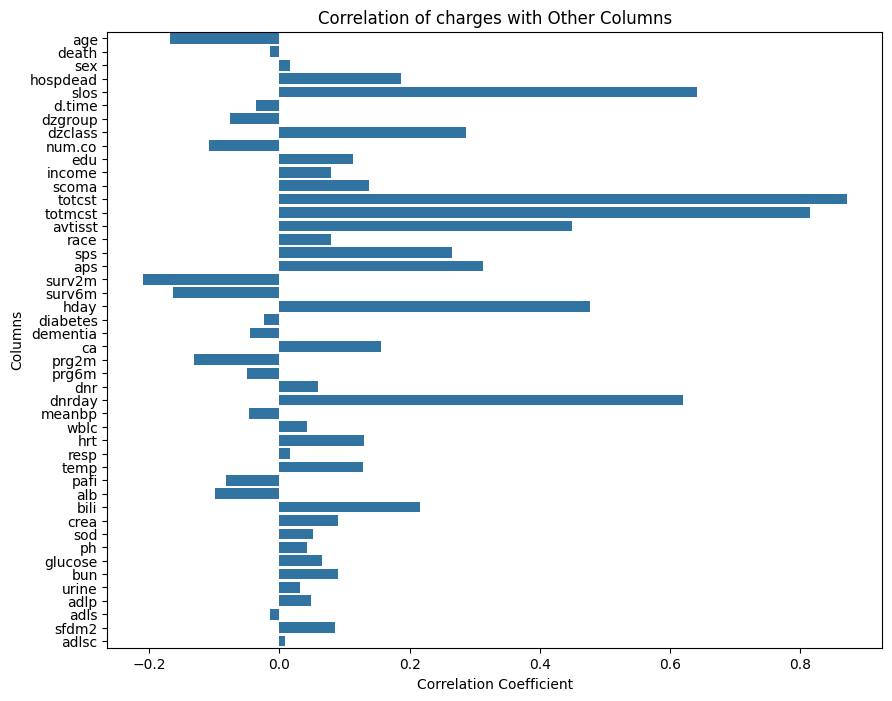

In [15]:
def cor(column_name):
  # Calculate correlation of 'target_column' with all other columns
  correlation = df_dummies.corrwith(df_dummies[column_name]).drop(column_name)

  # Reset index to convert the Series to a DataFrame, which is easier to plot
  correlation_df = correlation.reset_index()
  correlation_df.columns = ['Column', 'Correlation']

  # Plotting
  plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
  sns.barplot(x='Correlation', y='Column', data=correlation_df)
  plt.title(f'Correlation of {column_name} with Other Columns')
  plt.xlabel('Correlation Coefficient')
  plt.ylabel('Columns')
  plt.show()

# Correlation between charges Vs Other Columns
cor('charges')

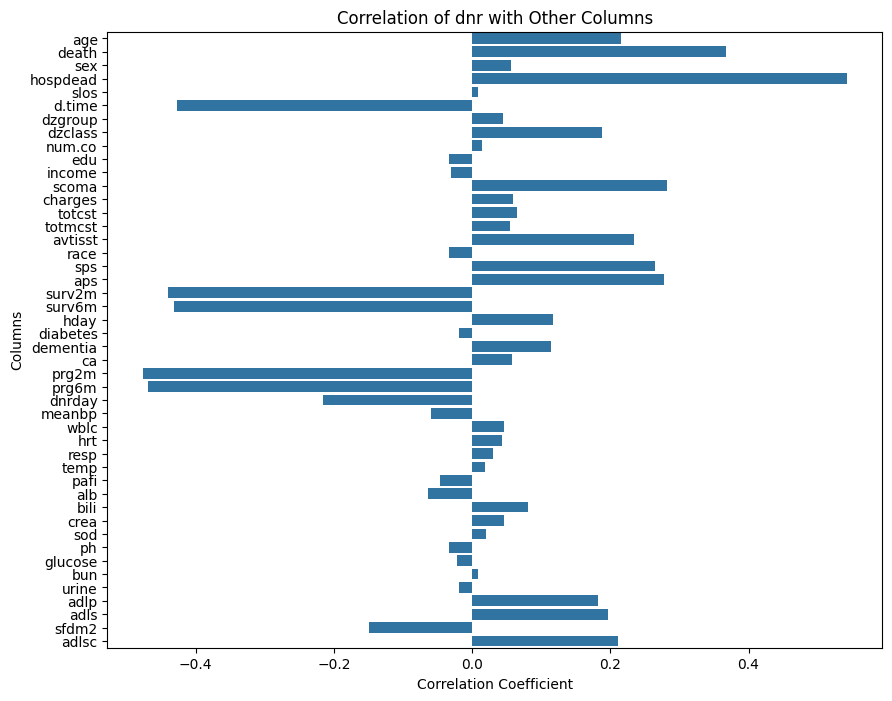

In [16]:
cor('dnr')

# Univariate Analysis

### Age

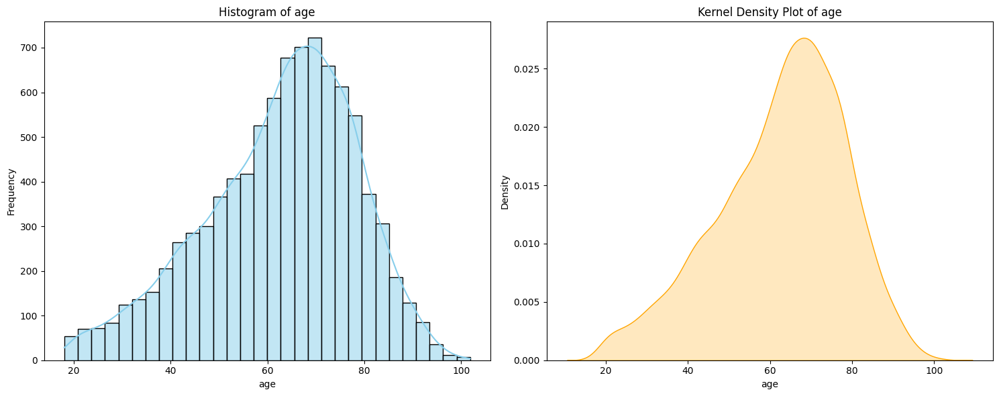

In [17]:
# Choose a numerical feature, e.g., age
feature = 'age'

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot histogram
sns.histplot(data=df[feature], kde=True, bins=30, color='skyblue', ax=axes[0])
axes[0].set_title(f'Histogram of {feature}')
axes[0].set_xlabel(feature)
axes[0].set_ylabel('Frequency')

# Plot kernel density plot
sns.kdeplot(data=df[feature], color='orange', fill=True, ax=axes[1])
axes[1].set_title(f'Kernel Density Plot of {feature}')
axes[1].set_xlabel(feature)
axes[1].set_ylabel('Density')

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

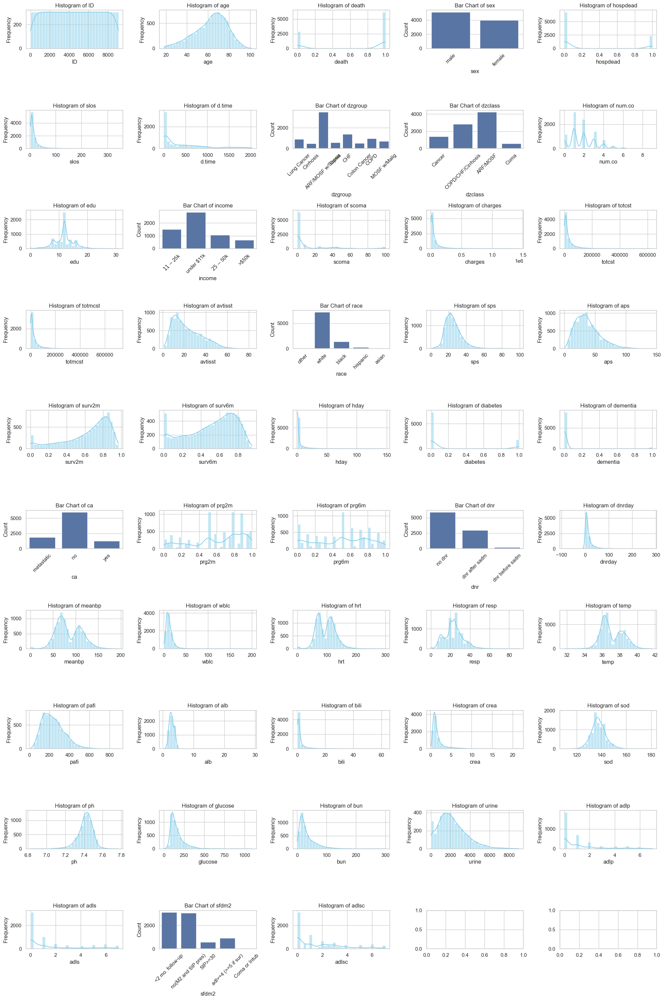

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of columns for univariate analysis
columns_for_analysis = ['ID', 'age', 'death', 'sex', 'hospdead', 'slos', 'd.time', 'dzgroup',
                         'dzclass', 'num.co', 'edu', 'income', 'scoma', 'charges', 'totcst',
                         'totmcst', 'avtisst', 'race', 'sps', 'aps', 'surv2m', 'surv6m', 'hday',
                         'diabetes', 'dementia', 'ca', 'prg2m', 'prg6m', 'dnr', 'dnrday',
                         'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea',
                         'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp', 'adls', 'sfdm2',
                         'adlsc']

# Set the style for better visualizations
sns.set(style="whitegrid")

# Create subplots
fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(20, 30))

# Flatten the axes for easier iteration
axes = axes.flatten()

# Loop through columns for analysis
for i, column in enumerate(columns_for_analysis):
    # Check the data type to choose the appropriate plot
    if df[column].dtype == 'object':
        # Bar chart for categorical columns
        sns.countplot(x=column, data=df, ax=axes[i])
        axes[i].set_title(f'Bar Chart of {column}')
        axes[i].set_xlabel(column)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)
    else:
        # Histogram for numerical columns
        sns.histplot(data=df[column], kde=True, bins=30, color='skyblue', ax=axes[i])
        axes[i].set_title(f'Histogram of {column}')
        axes[i].set_xlabel(column)
        axes[i].set_ylabel('Frequency')

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


# Bivariate Analysis

## Chi-Square test

First I will write the code to identify and segregate all the numerical and object datatypes.

In [19]:
# Identify numerical columns
numerical_columns = df.select_dtypes(include=['number']).columns.tolist()

# Identify object (categorical) columns
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

# Segregate the DataFrame based on data types
numerical_df = df[numerical_columns]
categorical_df = df[categorical_columns]

# Display the identified columns and segregated DataFrames
print("Numerical Columns:", numerical_columns)
print("\nCategorical Columns:", categorical_columns)

Numerical Columns: ['ID', 'age', 'death', 'hospdead', 'slos', 'd.time', 'num.co', 'edu', 'scoma', 'charges', 'totcst', 'totmcst', 'avtisst', 'sps', 'aps', 'surv2m', 'surv6m', 'hday', 'diabetes', 'dementia', 'prg2m', 'prg6m', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlp', 'adls', 'adlsc']

Categorical Columns: ['sex', 'dzgroup', 'dzclass', 'income', 'race', 'ca', 'dnr', 'sfdm2']


In [20]:
numerical_df.head()

,ID,age,death,hospdead,slos,d.time,num.co,edu,scoma,charges,totcst,totmcst,avtisst,sps,aps,surv2m,surv6m,hday,diabetes,dementia,prg2m,prg6m,dnrday,meanbp,wblc,hrt,resp,temp,pafi,alb,bili,crea,sod,ph,glucose,bun,urine,adlp,adls,adlsc
0,1,62.84998,0,0,5,2029,0,11.0,0.0,9715.0,NaN,NaN,7.000000,33.898438,20.0,0.262939,0.036995,1,0,0,0.50,0.25,5.0,97.0,6.000000,69.0,22.0,36.00000,388.00000,1.799805,0.199982,1.199951,141.0,7.459961,NaN,NaN,NaN,7.0,7.0,7.0
1,2,60.33899,1,1,4,4,2,12.0,44.0,34496.0,NaN,NaN,29.000000,52.695312,74.0,0.001000,0.000000,3,0,0,0.00,0.00,NaN,43.0,17.097656,112.0,34.0,34.59375,98.00000,NaN,NaN,5.500000,132.0,7.250000,NaN,NaN,NaN,NaN,1.0,1.0
2,3,52.74698,1,0,17,47,2,12.0,0.0,41094.0,NaN,NaN,13.000000,20.500000,45.0,0.790894,0.664917,4,0,0,0.75,0.50,17.0,70.0,8.500000,88.0,28.0,37.39844,231.65625,NaN,2.199707,2.000000,134.0,7.459961,NaN,NaN,NaN,1.0,0.0,0.0
3,4,42.38498,1,0,3,133,2,11.0,0.0,3075.0,NaN,NaN,7.000000,20.097656,19.0,0.698975,0.411987,1,0,0,0.90,0.50,3.0,75.0,9.099609,88.0,32.0,35.00000,NaN,NaN,NaN,0.799927,139.0,NaN,NaN,NaN,NaN,0.0,0.0,0.0
4,5,79.88495,0,0,16,2029,1,NaN,26.0,50127.0,NaN,NaN,18.666656,23.500000,30.0,0.634888,0.532959,3,0,0,0.90,0.90,16.0,59.0,13.500000,112.0,20.0,37.89844,173.31250,NaN,NaN,0.799927,143.0,7.509766,NaN,NaN,NaN,NaN,2.0,2.0


In [21]:
categorical_df.head()

,sex,dzgroup,dzclass,income,race,ca,dnr,sfdm2
0,male,Lung Cancer,Cancer,$11-$25k,other,metastatic,no dnr,NaN
1,female,Cirrhosis,COPD/CHF/Cirrhosis,$11-$25k,white,no,NaN,<2 mo. follow-up
2,female,Cirrhosis,COPD/CHF/Cirrhosis,under $11k,white,no,no dnr,<2 mo. follow-up
3,female,Lung Cancer,Cancer,under $11k,white,metastatic,no dnr,no(M2 and SIP pres)
4,female,ARF/MOSF w/Sepsis,ARF/MOSF,NaN,white,no,no dnr,no(M2 and SIP pres)


### <i>Since the Chi square test is done on the categorical variables, let's choose a few pairs.

#### Sex VS DZGroup

In [22]:
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(df['sex'], df['dzgroup'])

# Print the contingency table
print("Contingency Table:")
print(contingency_table)

# Perform the chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Display the results
print("\nChi-Square Statistic:", chi2)
print("Degrees of Freedom:", dof)
print("P-value:", p)
print("Expected Frequencies Table:")
print(pd.DataFrame(expected, index=contingency_table.index, columns=contingency_table.columns))

# Interpret the results
alpha = 0.05
print("\nSignificance Level (α):", alpha)
print("\nHypotheses:")
print("H0: There is no significant association between sex and dzgroup (They are independent).")
print("H1: There is a significant association between sex and dzgroup (They are not independent).")

# Compare p-value to the significance level
if p < alpha:
    print("\nReject the null hypothesis. There is a significant association between sex and dzgroup.")
else:
    print("\nFail to reject the null hypothesis. There is no significant association between sex and dzgroup.")


Contingency Table:
dzgroup  ARF/MOSF w/Sepsis  CHF  COPD  Cirrhosis  Colon Cancer  Coma  \
sex                                                                    
female                1591  528   476        184           223   311   
male                  1924  859   491        324           289   285   

dzgroup  Lung Cancer  MOSF w/Malig  
sex                                 
female           339           328  
male             569           384  

Chi-Square Statistic: 78.91900497985822
Degrees of Freedom: 7
P-value: 2.2878742233029138e-14
Expected Frequencies Table:
dzgroup  ARF/MOSF w/Sepsis         CHF        COPD  Cirrhosis  Colon Cancer  \
sex                                                                           
female         1536.485448  606.288852  422.697419  222.05821      223.8067   
male           1978.514552  780.711148  544.302581  285.94179      288.1933   

dzgroup        Coma  Lung Cancer  MOSF w/Malig  
sex                                             
female

<Figure size 1800x1000 with 0 Axes>

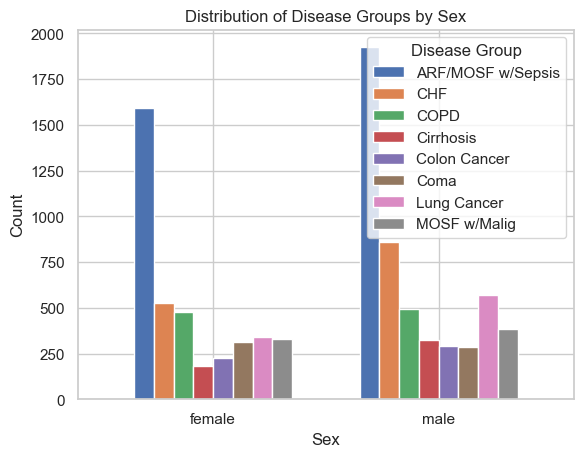

In [23]:
# Create a contingency table
contingency_table = pd.crosstab(df['sex'], df['dzgroup'])

# Plot a grouped bar chart
plt.figure(figsize=(18, 10))
contingency_table.plot(kind='bar', width=0.7, rot=0)

# Add labels and title
plt.xlabel('Sex')
plt.ylabel('Count')
plt.title('Distribution of Disease Groups by Sex')

# Show the plot
plt.legend(title='Disease Group')
plt.show()

#### Race VS DZgroup

Contingency Table for Race and Disease Group:
dzgroup   ARF/MOSF w/Sepsis   CHF  COPD  Cirrhosis  Colon Cancer  Coma  \
race                                                                     
asian                    33    12     1          5             5     5   
black                   568   268   103         61            45   122   
hispanic                123    54    20         29            19    14   
other                    40    17     5          8             8     7   
white                  2736  1034   834        403           431   444   

dzgroup   Lung Cancer  MOSF w/Malig  
race                                 
asian              11             7  
black             112           112  
hispanic           12            19  
other               9            18  
white             761           548  

Chi-Square Statistic: 133.47274635202797
Degrees of Freedom: 28
P-value: 1.0750333513447203e-15
Expected Frequencies Table:
dzgroup   ARF/MOSF w/Sepsis          CHF    

<Figure size 1200x600 with 0 Axes>

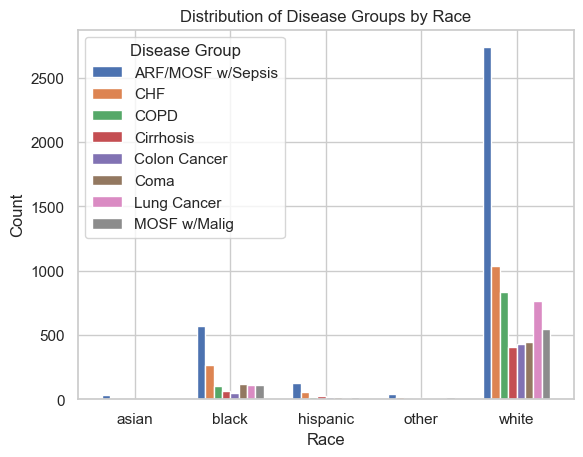

In [24]:
# Create a contingency table
contingency_table_race = pd.crosstab(df['race'], df['dzgroup'])

# Print the contingency table
print("Contingency Table for Race and Disease Group:")
print(contingency_table_race)

# Perform the chi-square test
chi2_race, p_race, dof_race, expected_race = chi2_contingency(contingency_table_race)

# Display the results
print("\nChi-Square Statistic:", chi2_race)
print("Degrees of Freedom:", dof_race)
print("P-value:", p_race)
print("Expected Frequencies Table:")
print(pd.DataFrame(expected_race, index=contingency_table_race.index, columns=contingency_table_race.columns))

# Interpret the results
alpha = 0.05
print("\nSignificance Level (α):", alpha)
print("\nHypotheses:")
print("H0: There is no significant association between race and dzgroup (They are independent).")
print("H1: There is a significant association between race and dzgroup (They are not independent).")

# Compare p-value to the significance level
if p_race < alpha:
    print("\nReject the null hypothesis. There is a significant association between race and dzgroup.")
else:
    print("\nFail to reject the null hypothesis. There is no significant association between race and dzgroup.")

# Plot a grouped bar chart for visualization
plt.figure(figsize=(12, 6))
contingency_table_race.plot(kind='bar', width=0.7, rot=0)

# Add labels and title
plt.xlabel('Race')
plt.ylabel('Count')
plt.title('Distribution of Disease Groups by Race')

# Show the plot
plt.legend(title='Disease Group')
plt.show()


It seems like the dataset is way to skewed towards the white race. let us find out the number of people in each race

In [25]:
race_counts = df['race'].value_counts()

# diplaying the counts
print('The number of occurances for each race:')
print(race_counts)

The number of occurances for each race:
race
white       7191
black       1391
hispanic     290
other        112
asian         79
Name: count, dtype: int64


From the provided counts of occurrences for each race in the dataset, we can make several inferences:

1. **Imbalance in Representation:**
   - The majority of the patients in the dataset are classified as "white," with 7191 occurrences.
   - The number of occurrences for other races is comparatively lower, with "black" having 1391 occurrences, "hispanic" with 290, "other" with 112, and "asian" with 79.

2. **Potential Bias:**
   - The over-representation of a particular racial group (in this case, "white") might introduce bias in the analysis. 

3. **Impact on Chi-Square Test:**
   - In the context of the chi-square test between 'race' and 'dzgroup,' the results may be influenced by the large number of occurrences in the "white" category. It's crucial to interpret the statistical significance in light of the imbalances in the sample sizes of different racial groups.

4. **Consideration for Subgroup Analysis:**
   - Depending on your research question and objectives, you may want to consider conducting subgroup analyses or adjusting for the imbalance in racial representation to ensure fair and meaningful comparisons across groups.

5. **Ethical Considerations:**
   - The unequal distribution of racial categories raises ethical considerations. Researchers should be mindful of the potential impact on the interpretation of results, especially when addressing questions related to health disparities or outcomes across different racial groups.


#### Income VS DZGroup

Contingency Table for Income and Disease Group:
dzgroup     ARF/MOSF w/Sepsis  CHF  COPD  Cirrhosis  Colon Cancer  Coma  \
income                                                                    
$11-$25k                  579  260   155         74            85    90   
$25-$50k                  406  136    57         53            84    53   
>$50k                     221   88    29         40            89    42   
under $11k               1086  501   442        206            72   173   

dzgroup     Lung Cancer  MOSF w/Malig  
income                                 
$11-$25k            171           113  
$25-$50k            151           117  
>$50k               101            74  
under $11k          196           179  

Chi-Square Statistic: 370.42695001059474
Degrees of Freedom: 21
P-value: 1.186036934519784e-65
Expected Frequencies Table:
dzgroup     ARF/MOSF w/Sepsis         CHF        COPD   Cirrhosis  \
income                                                              

<Figure size 1200x600 with 0 Axes>

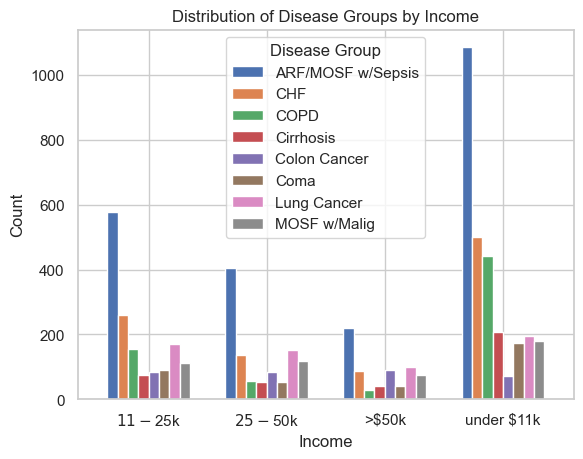

In [26]:
# Create a contingency table
contingency_table_income = pd.crosstab(df['income'], df['dzgroup'])

# Print the contingency table
print("Contingency Table for Income and Disease Group:")
print(contingency_table_income)

# Perform the chi-square test
chi2_income, p_income, dof_income, expected_income = chi2_contingency(contingency_table_income)

# Display the results
print("\nChi-Square Statistic:", chi2_income)
print("Degrees of Freedom:", dof_income)
print("P-value:", p_income)
print("Expected Frequencies Table:")
print(pd.DataFrame(expected_income, index=contingency_table_income.index, columns=contingency_table_income.columns))

# Interpret the results
alpha = 0.05
print("\nSignificance Level (α):", alpha)
print("\nHypotheses:")
print("H0: There is no significant association between income and dzgroup (They are independent).")
print("H1: There is a significant association between income and dzgroup (They are not independent).")

# Compare p-value to the significance level
if p_income < alpha:
    print("\nReject the null hypothesis. There is a significant association between income and dzgroup.")
else:
    print("\nFail to reject the null hypothesis. There is no significant association between income and dzgroup.")

# Plot a grouped bar chart for visualization
plt.figure(figsize=(12, 6))
contingency_table_income.plot(kind='bar', width=0.7, rot=0)

# Add labels and title
plt.xlabel('Income')
plt.ylabel('Count')
plt.title('Distribution of Disease Groups by Income')

# Show the plot
plt.legend(title='Disease Group')
plt.show()


## Regression Analysis

#### Age VS Death Probability

Learned Parameters:
[-0.22376731  0.02925597]


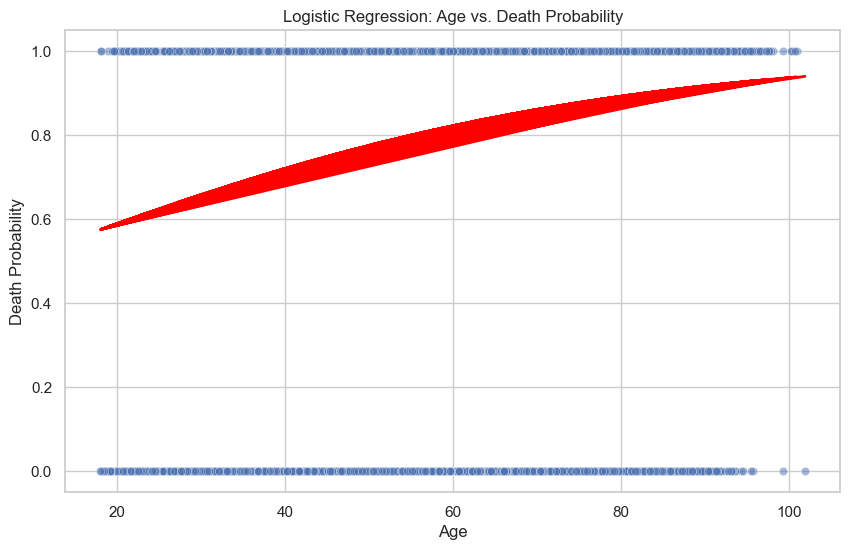

In [57]:
# Selecting relevant columns
df_regression = df[['age', 'death']]

# Handling missing values if any
df_regression = df_regression.dropna()

# Extracting independent variable (X) and dependent variable (y)
X = df_regression['age']
y = df_regression['death']

# Adding a constant term to the independent variable for the intercept
X = np.c_[np.ones(X.shape[0]), X]

# Define sigmoid function
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

# Initialize parameters
theta = np.zeros(X.shape[1])

# Define the hypothesis function
def hypothesis(X, theta):
    return sigmoid(np.dot(X, theta))

# Define the cost function (logistic loss)
def cost_function(X, y, theta):
    m = len(y)
    h = hypothesis(X, theta)
    return -1/m * (np.dot(y, np.log(h)) + np.dot((1 - y), np.log(1 - h)))

# Define the gradient descent function
def gradient_descent(X, y, theta, learning_rate, iterations):
    m = len(y)
    costs = []

    for _ in range(iterations):
        h = hypothesis(X, theta)
        gradient = np.dot(X.T, (h - y)) / m
        theta -= learning_rate * gradient
        cost = cost_function(X, y, theta)
        costs.append(cost)

    return theta, costs

# Set hyperparameters
learning_rate = 0.01
iterations = 1000

# Perform gradient descent
theta, costs = gradient_descent(X, y, theta, learning_rate, iterations)

# Print the learned parameters
print("Learned Parameters:")
print(theta)

# Visualizing the logistic regression curve
plt.figure(figsize=(10, 6))
sns.scatterplot(x='age', y='death', data=df_regression, alpha=0.5)
plt.plot(df_regression['age'], sigmoid(np.dot(X, theta)), color='red', linewidth=2)
plt.title('Logistic Regression: Age vs. Death Probability')
plt.xlabel('Age')
plt.ylabel('Death Probability')
plt.show()

### Age VS Dementia

In [29]:
df['dementia'].value_counts()

dementia
0    8809
1     296
Name: count, dtype: int64

Optimization terminated successfully.
         Current function value: 0.118342
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:               dementia   No. Observations:                 9105
Model:                          Logit   Df Residuals:                     9103
Method:                           MLE   Df Model:                            1
Date:                Mon, 18 Dec 2023   Pseudo R-squ.:                  0.1745
Time:                        13:33:58   Log-Likelihood:                -1077.5
converged:                       True   LL-Null:                       -1305.3
Covariance Type:            nonrobust   LLR p-value:                4.400e-101
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -11.3685      0.489    -23.249      0.000     -12.327     -10.410
age            0.1109      0.

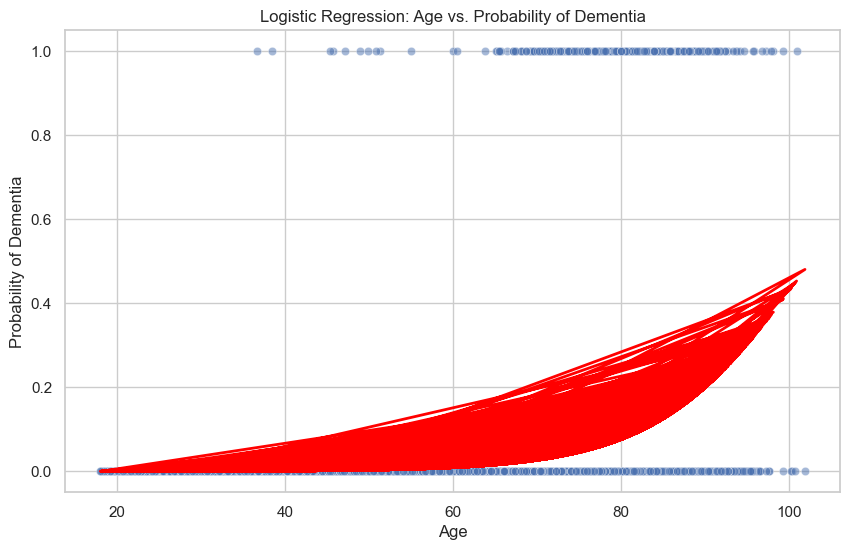

In [30]:
# Selecting relevant columns
df_regression = df[['age', 'dementia']]

# Handling missing values if any
df_regression = df_regression.dropna()

# Extracting independent variable (X) and dependent variable (y)
X = df_regression['age']
y = df_regression['dementia']

# Adding a constant term to the independent variable for the intercept
X = sm.add_constant(X)

# Creating and fitting the logistic regression model
model = sm.Logit(y, X).fit()

# Print the logistic regression summary
print(model.summary())

# Hypothesis Testing
# Null Hypothesis (H0): The coefficient of 'age' is not significantly different from zero.
# Alternative Hypothesis (H1): The coefficient of 'age' is significantly different from zero.

# Extracting p-value for 'age' coefficient
p_value_age = model.pvalues['age']

# Significance level (alpha)
alpha = 0.05

# Print the results of hypothesis testing
print(f"\nHypothesis Testing for 'age' coefficient:")
print(f"P-value: {p_value_age}")
print(f"Significance Level (alpha): {alpha}")

# Compare p-value to the significance level
if p_value_age < alpha:
    print("\nReject the null hypothesis. The coefficient of 'age' is significantly different from zero, or in other words, the variable 'age' has a statistically significant impact on the dependent variable, dementia.")
else:
    print("\nFail to reject the null hypothesis. The coefficient of 'age' is not significantly different from zero.")

# Predictions from the model (probability of dementia)
predictions_prob = model.predict(X)

# Converting probabilities to binary predictions (0 or 1)
predictions_binary = (predictions_prob >= 0.5).astype(int)

# Visualizing the logistic regression curve
plt.figure(figsize=(10, 6))
sns.scatterplot(x='age', y='dementia', data=df_regression, alpha=0.5)
plt.plot(df_regression['age'], predictions_prob, color='red', linewidth=2)
plt.title('Logistic Regression: Age vs. Probability of Dementia')
plt.xlabel('Age')
plt.ylabel('Probability of Dementia')
plt.show()


Logistic Regression Summary:
Slope (Coefficient): 0.0022213245627423
Intercept: -0.10665820172714519

Hypothesis Testing for 'age' coefficient:
P-value: 5.722208536177246e-79
Significance Level (alpha): 0.05

Reject the null hypothesis. The coefficient of 'age' is significantly different from zero, or in other words, the variable 'age' has a statistically significant impact on the dependent variable, dementia.


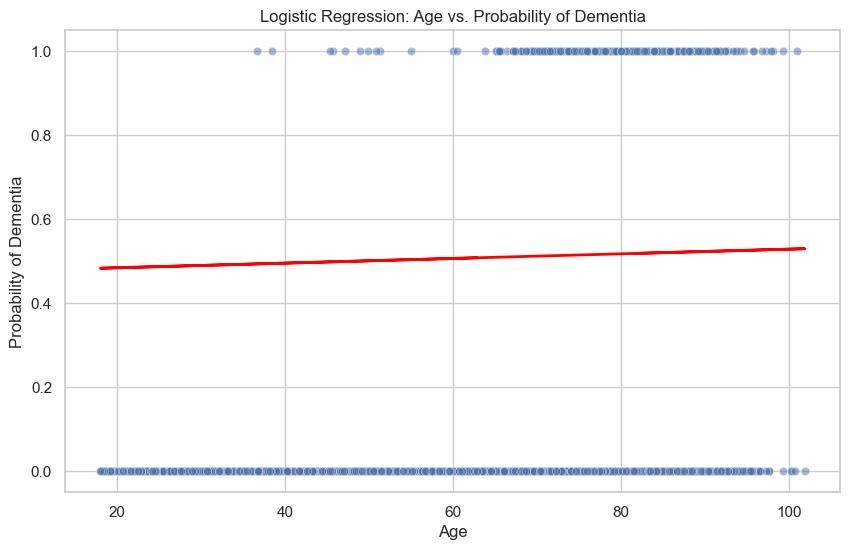

In [31]:
import numpy as np
import pandas as pd
from scipy.stats import linregress
import matplotlib.pyplot as plt
import seaborn as sns

# Selecting relevant columns
df_regression = df[['age', 'dementia']]

# Handling missing values if any
df_regression = df_regression.dropna()

# Extracting independent variable (X) and dependent variable (y)
X = df_regression['age']
y = df_regression['dementia']

# Adding a constant term to the independent variable for the intercept
X = np.column_stack((np.ones_like(X), X))

# Creating linear regression model
slope, intercept, _, _, _ = linregress(X[:, 1], y)

# Logistic function
def logistic_function(x):
    return 1 / (1 + np.exp(-(intercept + slope * x)))

# Print logistic regression summary
print("\nLogistic Regression Summary:")
print(f"Slope (Coefficient): {slope}")
print(f"Intercept: {intercept}")

# Hypothesis Testing
# Null Hypothesis (H0): The coefficient of 'age' is not significantly different from zero.
# Alternative Hypothesis (H1): The coefficient of 'age' is significantly different from zero.

# Extracting p-value for 'age' coefficient
p_value_age = linregress(X[:, 1], y)[3]

# Significance level (alpha)
alpha = 0.05

# Print the results of hypothesis testing
print(f"\nHypothesis Testing for 'age' coefficient:")
print(f"P-value: {p_value_age}")
print(f"Significance Level (alpha): {alpha}")

# Compare p-value to the significance level
if p_value_age < alpha:
    print("\nReject the null hypothesis. The coefficient of 'age' is significantly different from zero, or in other words, the variable 'age' has a statistically significant impact on the dependent variable, dementia.")
else:
    print("\nFail to reject the null hypothesis. The coefficient of 'age' is not significantly different from zero.")

# Predictions from the model (probability of dementia)
predictions_prob = logistic_function(X[:, 1])

# Converting probabilities to binary predictions (0 or 1)
predictions_binary = (predictions_prob >= 0.5).astype(int)

# Visualizing the logistic regression curve
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_regression['age'], y=y, alpha=0.5)
plt.plot(df_regression['age'], predictions_prob, color='red', linewidth=2)
plt.title('Logistic Regression: Age vs. Probability of Dementia')
plt.xlabel('Age')
plt.ylabel('Probability of Dementia')
plt.show()


##### <i><b>In accordance with the dataset at hand, a discernible pattern becomes evident, indicating a marked exponential rise in the probability of dementia, particularly manifesting beyond the age threshold of 70.

# 1. Demographic Analysis:

## 1.1. What is the distribution of age among the critically ill patients?

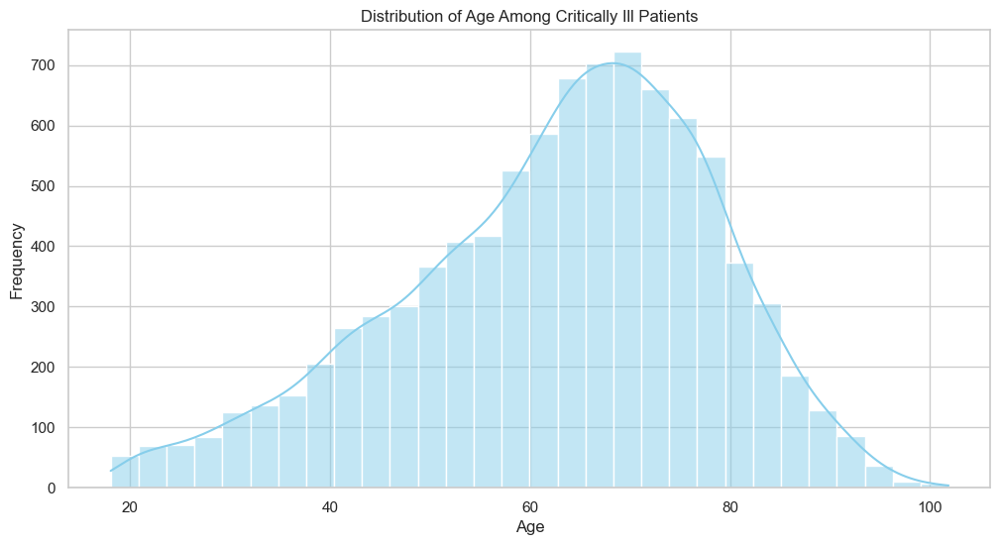

In [32]:
plt.figure(figsize=(12, 6))
sns.histplot(df['age'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Age Among Critically Ill Patients')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

## 1.2. How is the dataset distributed across different races and genders?

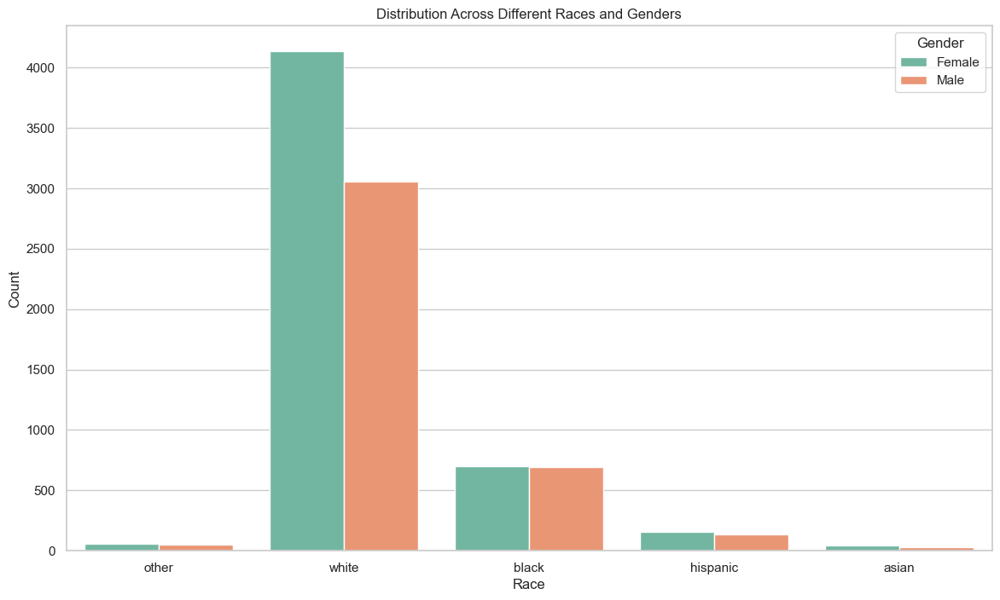

In [33]:
plt.figure(figsize=(14, 8))
sns.countplot(x='race', hue='sex', data=df, palette='Set2')
plt.title('Distribution Across Different Races and Genders')
plt.xlabel('Race')
plt.ylabel('Count')
plt.legend(title='Gender', loc='upper right', labels=['Female', 'Male'])
plt.show()

# 2. Disease Severity

## 2.1. Which disease categories (dzgroup and dzclass) are most prevalent in the dataset?

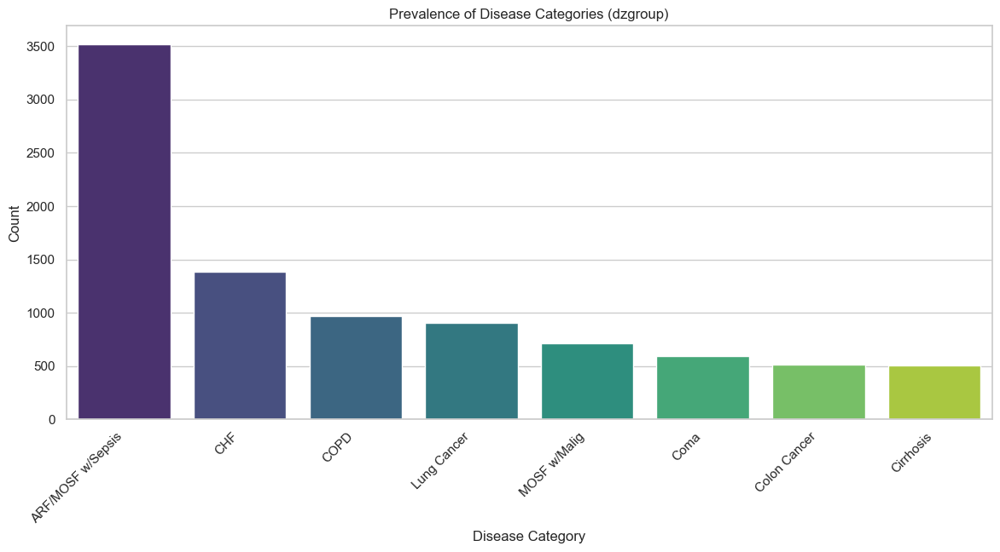

In [34]:
# Prevalence of Disease Categories (dzgroup)
plt.figure(figsize=(14, 6))
sns.countplot(x='dzgroup', data=df, palette='viridis', order=df['dzgroup'].value_counts().index)
plt.title('Prevalence of Disease Categories (dzgroup)')
plt.xlabel('Disease Category')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

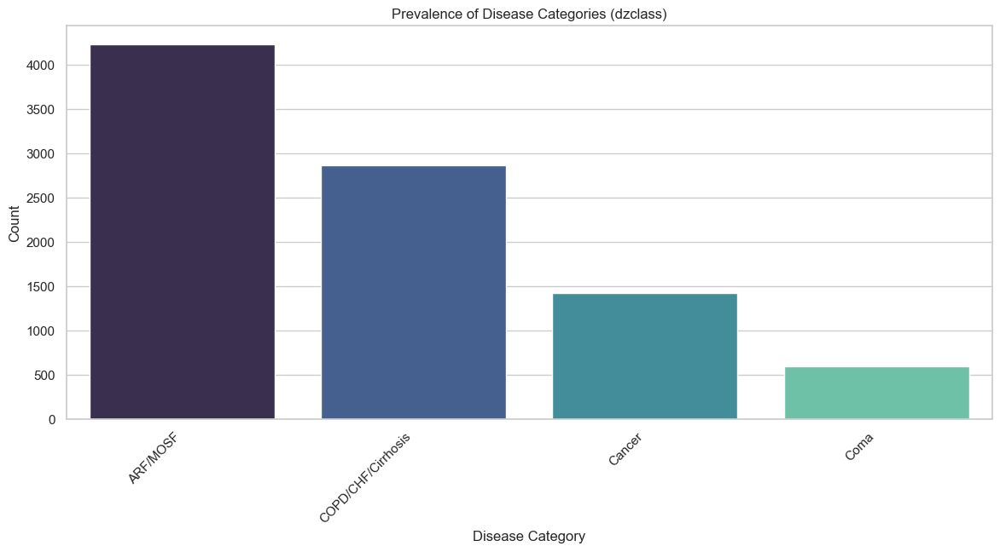

In [35]:
# Prevalence of Disease Categories (dzclass)
plt.figure(figsize=(14, 6))
sns.countplot(x='dzclass', data=df, palette='mako', order=df['dzclass'].value_counts().index)
plt.title('Prevalence of Disease Categories (dzclass)')
plt.xlabel('Disease Category')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

## 2.2. Is there a correlation between the number of comorbidities (num.co) and disease severity?

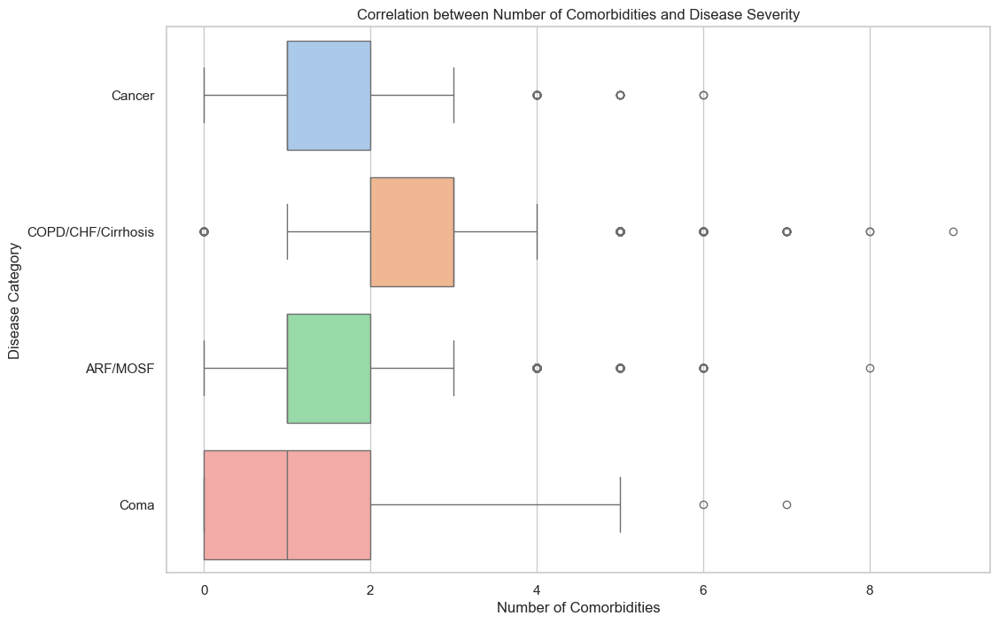

In [36]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='num.co', y='dzclass', data=df, palette='pastel')
plt.title('Correlation between Number of Comorbidities and Disease Severity')
plt.xlabel('Number of Comorbidities')
plt.ylabel('Disease Category')
plt.show()

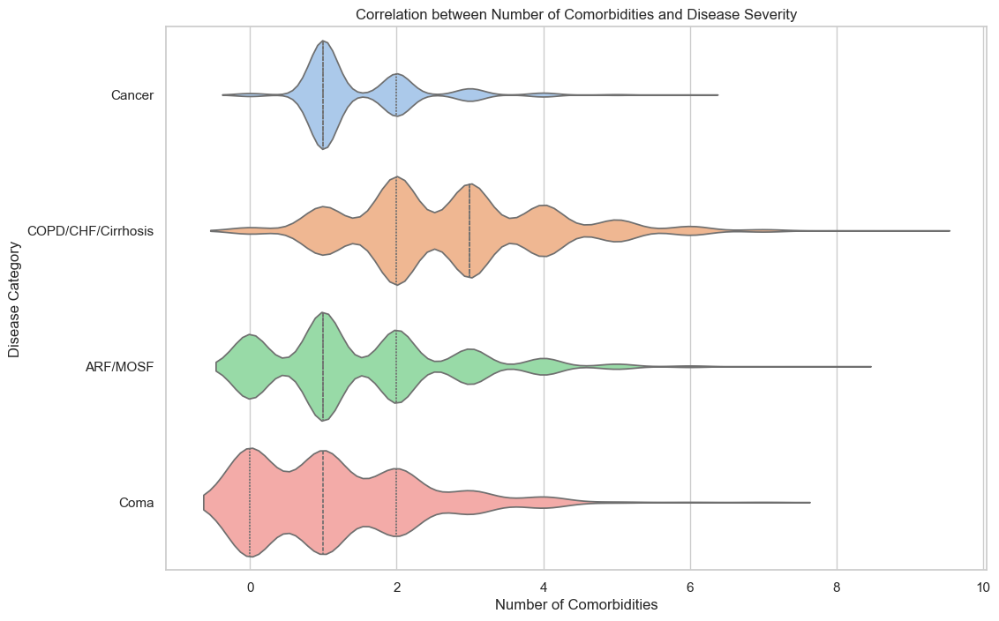

In [37]:
# Violin plot for Correlation between Number of Comorbidities (num.co) and Disease Severity
plt.figure(figsize=(12, 8))
sns.violinplot(x='num.co', y='dzclass', data=df, palette='pastel', inner='quartile')
plt.title('Correlation between Number of Comorbidities and Disease Severity')
plt.xlabel('Number of Comorbidities')
plt.ylabel('Disease Category')
plt.show()

# 3. Survival Rates

## 3.1. What are the overall 2-month and 6-month survival rates in the dataset, and how do survival rates vary across different disease categories or demographic groups?

In [39]:
# Overall 2-month and 6-month survival rates
overall_2m_survival_rate = df['surv2m'].mean() * 100
overall_6m_survival_rate = df['surv6m'].mean() * 100

print(f"Overall 2-month Survival Rate: {overall_2m_survival_rate:.2f}%")
print(f"Overall 6-month Survival Rate: {overall_6m_survival_rate:.2f}%")

Overall 2-month Survival Rate: 63.59%
Overall 6-month Survival Rate: 52.01%


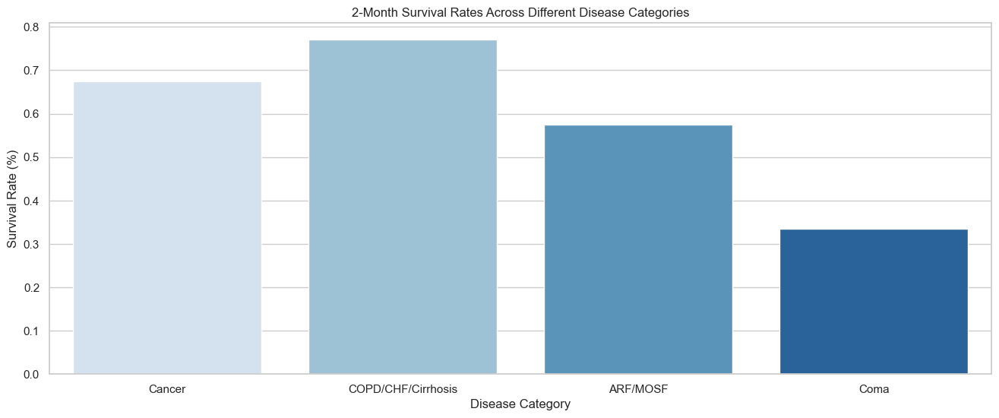

In [40]:
# Visualize survival rates across different disease categories
plt.figure(figsize=(16, 6))
sns.barplot(x='dzclass', y='surv2m', data=df, ci=None, palette='Blues')
plt.title('2-Month Survival Rates Across Different Disease Categories')
plt.xlabel('Disease Category')
plt.ylabel('Survival Rate (%)')
plt.show()

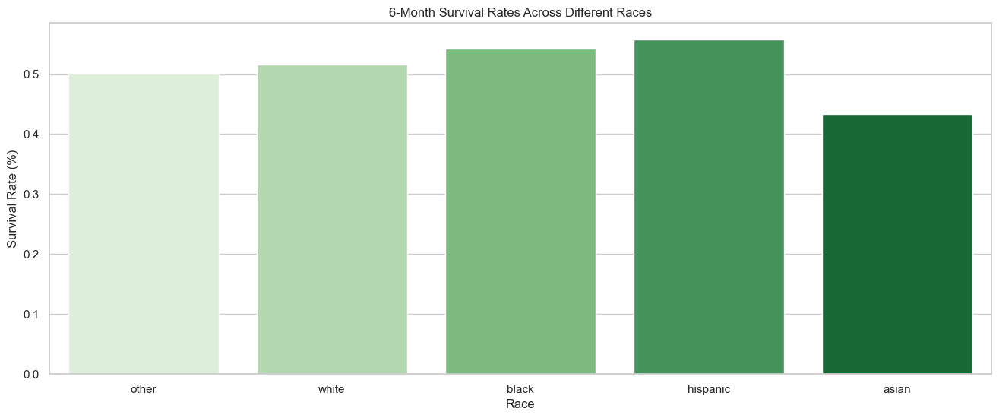

In [41]:
# Visualize survival rates across different demographic groups
plt.figure(figsize=(16, 6))
sns.barplot(x='race', y='surv6m', data=df, ci=None, palette='Greens')
plt.title('6-Month Survival Rates Across Different Races')
plt.xlabel('Race')
plt.ylabel('Survival Rate (%)')
plt.show()

# 4. Financial Impact:

## 4.1. How are charges and total costs (charges, totcst, totmcst) distributed across the dataset?

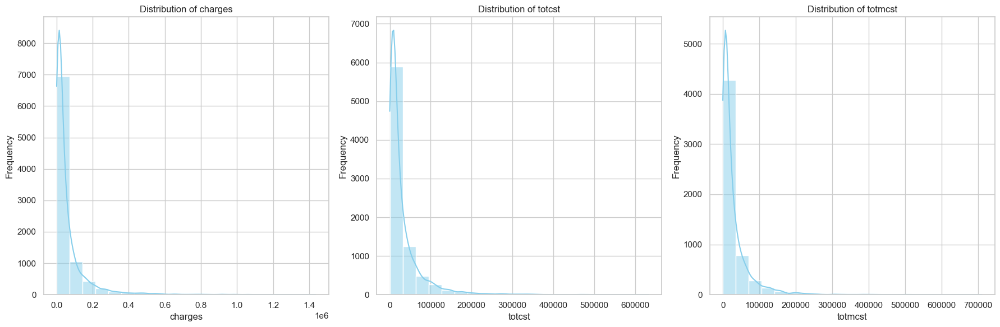

In [44]:
# Financial Impact: Distribution of Charges and Total Costs
financial_variables = ['charges', 'totcst', 'totmcst']

# Distribution of Charges, Total Costs, and Total Micro Costs
plt.figure(figsize=(18, 6))
for i, variable in enumerate(financial_variables, 1):
    plt.subplot(1, 3, i)
    sns.histplot(df[variable], bins=20, kde=True, color='skyblue')
    plt.title(f'Distribution of {variable}')
    plt.xlabel(variable)
    plt.ylabel('Frequency')

plt.tight_layout()

# 5. Comorbidity Analysis:

## 5.1. How common are diabetes and dementia among the critically ill patients?

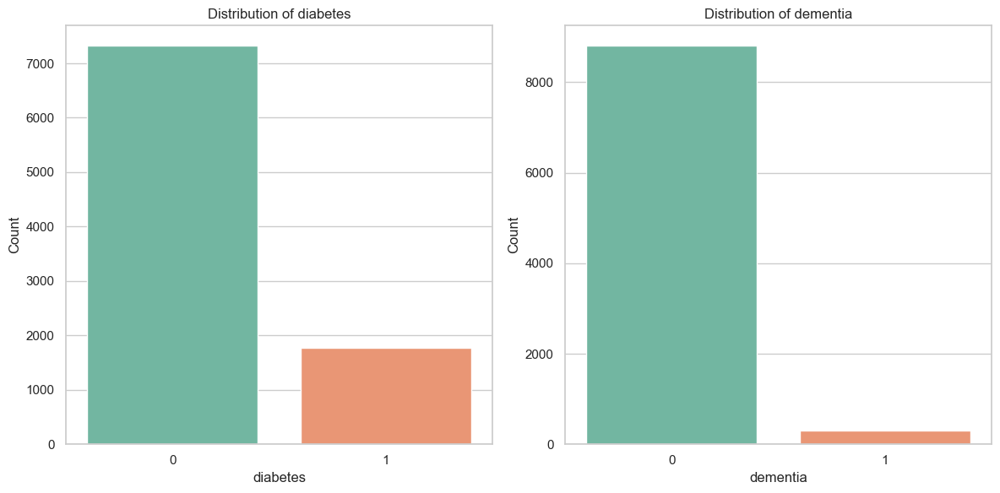

In [46]:
# Comorbidity Analysis: Diabetes and Dementia
comorbidity_variables = ['diabetes', 'dementia']

# Countplot for Diabetes and Dementia
plt.figure(figsize=(12, 6))
for i, variable in enumerate(comorbidity_variables, 1):
    plt.subplot(1, 2, i)
    sns.countplot(x=variable, data=df, palette='Set2')
    plt.title(f'Distribution of {variable}')
    plt.xlabel(variable)
    plt.ylabel('Count')

plt.tight_layout()
plt.show()

## 5.2. Are there any associations between certain comorbidities (e.g., diabetes) and disease categories?

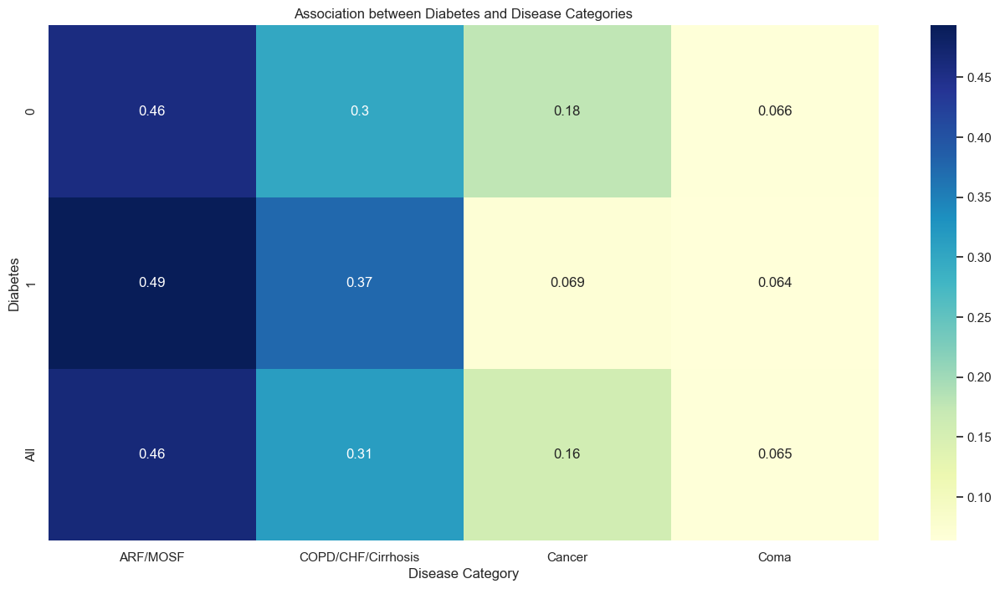

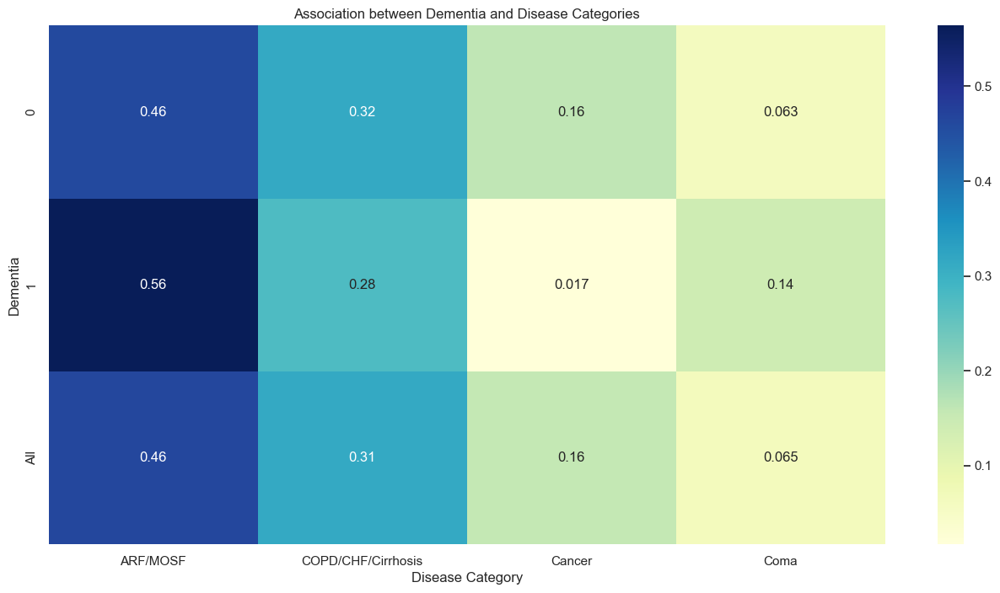

In [47]:
# Association between Comorbidities and Disease Categories
plt.figure(figsize=(16, 8))
sns.heatmap(pd.crosstab(df['diabetes'], df['dzclass'], margins=True, normalize='index'), annot=True, cmap='YlGnBu')
plt.title('Association between Diabetes and Disease Categories')
plt.xlabel('Disease Category')
plt.ylabel('Diabetes')
plt.show()

plt.figure(figsize=(16, 8))
sns.heatmap(pd.crosstab(df['dementia'], df['dzclass'], margins=True, normalize='index'), annot=True, cmap='YlGnBu')
plt.title('Association between Dementia and Disease Categories')
plt.xlabel('Disease Category')
plt.ylabel('Dementia')
plt.show()

# 6. Physiological Measures:

## 6.1. How are physiological measures (meanbp, wblc, hrt, resp, temp, pafi) distributed among patients?

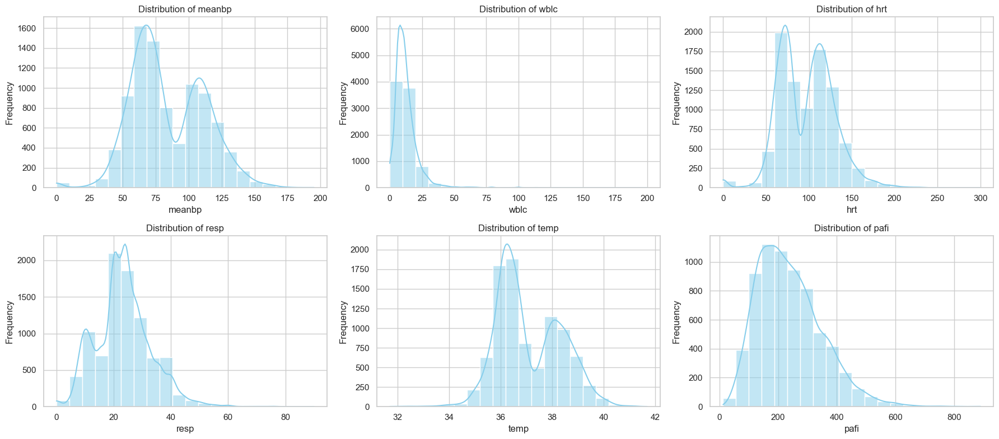

In [50]:
# Physiological Measures Analysis
physiological_variables = ['meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi']

# Distribution of Physiological Measures
plt.figure(figsize=(18, 8))
for i, variable in enumerate(physiological_variables, 1):
    plt.subplot(2, 3, i)
    sns.histplot(df[variable].dropna(), bins=20, kde=True, color='skyblue')
    plt.title(f'Distribution of {variable}')
    plt.xlabel(variable)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

## 6.2. Is there a correlation between physiological measures and survival rates?

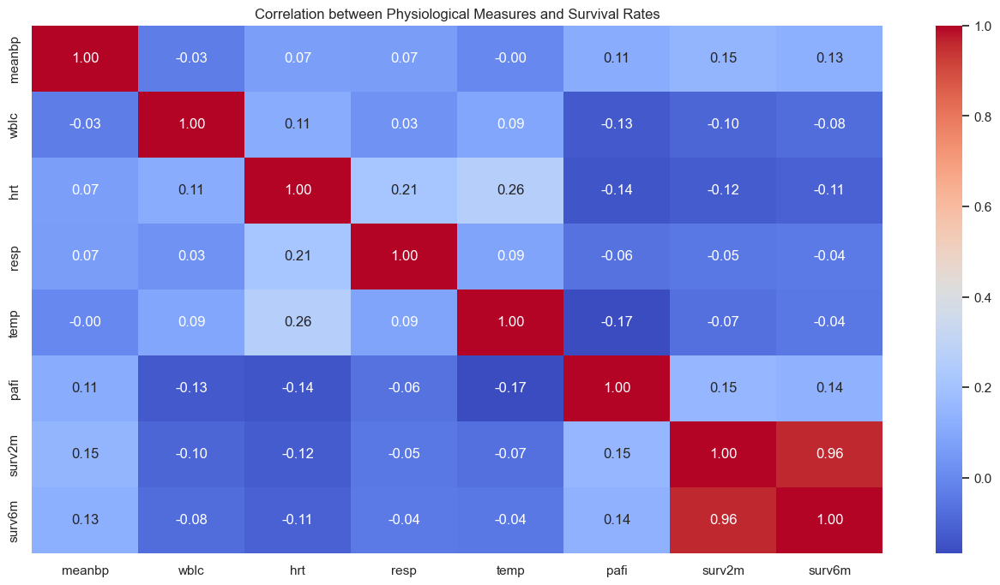

In [51]:
# Correlation between Physiological Measures and Survival Rates
plt.figure(figsize=(16, 8))
physiological_survival_corr = df[physiological_variables + ['surv2m', 'surv6m']].corr()
sns.heatmap(physiological_survival_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation between Physiological Measures and Survival Rates')
plt.show()

# 7. Impact of Education and Income

## 7.1. How is the distribution of education levels (edu) and income among the patients?

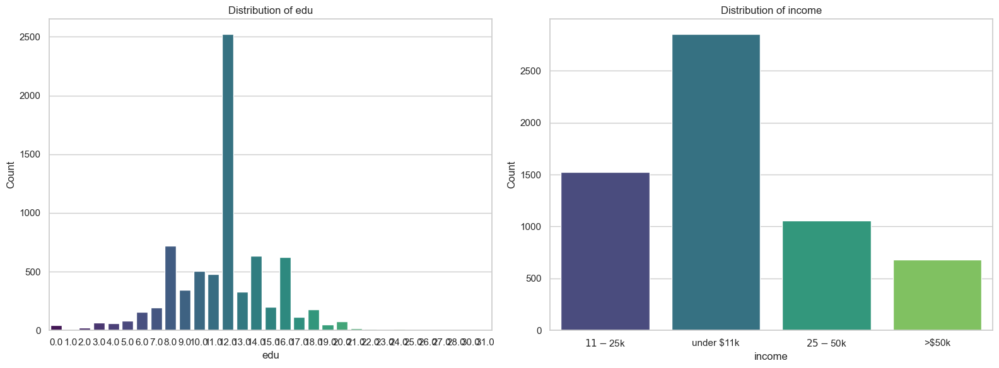

In [52]:
# Impact of Education and Income Analysis
education_income_variables = ['edu', 'income']

# Distribution of Education Levels and Income
plt.figure(figsize=(16, 6))

for i, variable in enumerate(education_income_variables, 1):
    plt.subplot(1, 2, i)
    sns.countplot(x=variable, data=df, palette='viridis')
    plt.title(f'Distribution of {variable}')
    plt.xlabel(variable)
    plt.ylabel('Count')

plt.tight_layout()
plt.show()

## 7.2. Is there a relationship between education, income, and disease severity or survival rates?

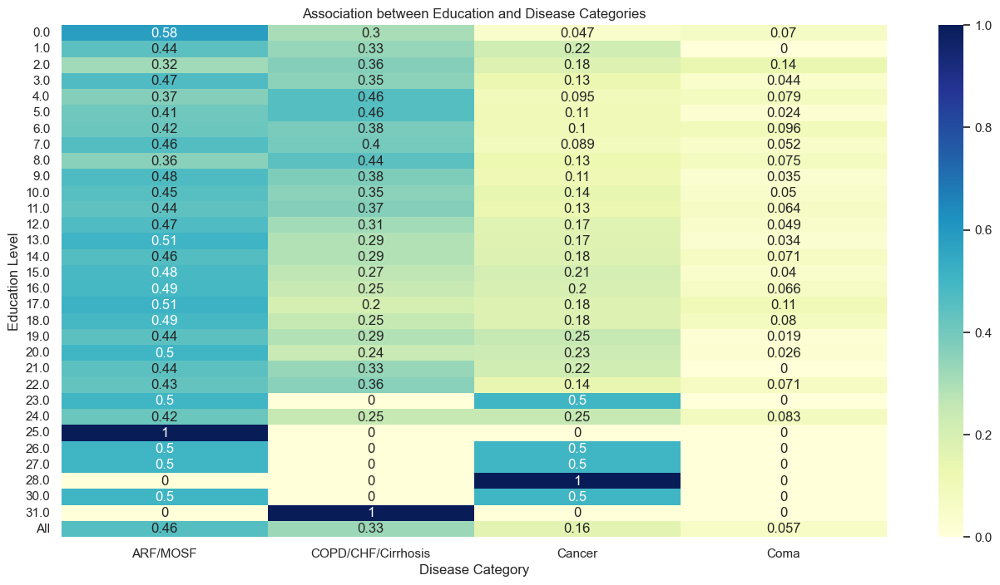

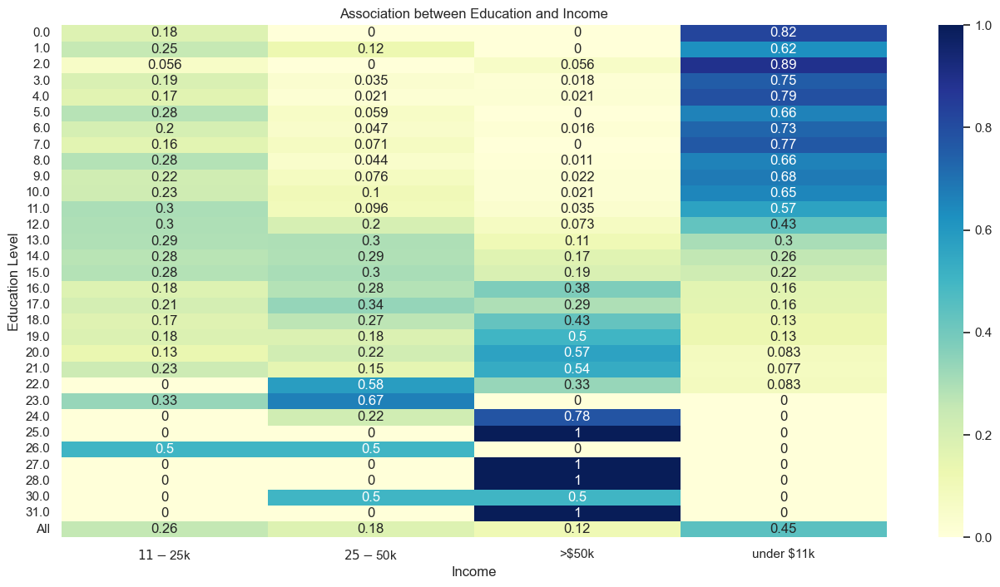

In [53]:
# Relationship between Education, Income, and Disease Severity
plt.figure(figsize=(16, 8))
sns.heatmap(pd.crosstab(df['edu'], df['dzclass'], margins=True, normalize='index'), annot=True, cmap='YlGnBu')
plt.title('Association between Education and Disease Categories')
plt.xlabel('Disease Category')
plt.ylabel('Education Level')
plt.show()

# Relationship between Education, Income, and Survival Rates
plt.figure(figsize=(16, 8))
sns.heatmap(pd.crosstab(df['edu'], df['income'], margins=True, normalize='index'), annot=True, cmap='YlGnBu')
plt.title('Association between Education and Income')
plt.xlabel('Income')
plt.ylabel('Education Level')
plt.show()